# Extinction Color Examination


This is in no way similar to "notebooks/ModuleBCatalogCrossmatch.ipynb" but git thinks it is so I'm adding this to dissuade it.

In [1]:
%matplotlib inline

In [2]:
basepath = '/orange/adamginsburg/jwst/brick/'

In [3]:
cd $basepath

/blue/adamginsburg/adamginsburg/jwst/brick


In [4]:
import sys
if '' in sys.path:
    sys.path.remove('')

In [5]:
%run $basepath/analysis/analysis_setup.py

/orange/adamginsburg/jwst/brick/analysis/analysis_setup.py:4: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import sys, imp
/orange/adamginsburg/jwst/brick//reduction/filtering.py:20: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm
Set OBSGEO-B to   -20.646359 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526234830.949 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2022-08-28T03:05:33.037' from MJD-AVG.
Set DATE-END to '2022-08-28T03:34:03.365' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -20.643813 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526204922.487 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -20.631897 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526059356.900 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2022-08-28T03:05:32.473' from MJD-AVG.
Set DATE-END t

For module nrca catalog crowdsource_nsky0_nrca_photometry_tables_merged.fits, mod date is 2023-07-02 12:25:51
For module nrcb catalog crowdsource_nsky0_nrcb_photometry_tables_merged.fits, mod date is 2023-07-02 12:37:11
For module merged catalog crowdsource_nsky0_merged_photometry_tables_merged.fits, mod date is 2023-07-02 10:13:35
For module merged-reproject catalog crowdsource_nsky0_merged-reproject_photometry_tables_merged.fits, mod date is 2023-07-02 09:17:00


In [6]:
%run $basepath/analysis/selections.py --module=merged-reproject

For module nrca catalog crowdsource_nsky0_nrca_photometry_tables_merged.fits, mod date is 2023-07-02 12:25:51
For module nrcb catalog crowdsource_nsky0_nrcb_photometry_tables_merged.fits, mod date is 2023-07-02 12:37:11
For module merged catalog crowdsource_nsky0_merged_photometry_tables_merged.fits, mod date is 2023-07-02 10:13:35
For module merged-reproject catalog crowdsource_nsky0_merged-reproject_photometry_tables_merged.fits, mod date is 2023-07-02 09:17:00
Selecting module merged-reproject
487 saturated in near_saturated_f212n_f212n
39 saturated in near_saturated_f466n_f466n
718 saturated in near_saturated_f405n_f405n
293 saturated in near_saturated_f187n_f187n
3210 saturated in near_saturated_f182m_f182m
6052 near saturated out of 325221.  That leaves 319169 not near unsaturated
74 saturated in replaced_saturated_f212n
14 saturated in replaced_saturated_f466n
215 saturated in replaced_saturated_f405n
22 saturated in replaced_saturated_f187n
147 saturated in replaced_saturated_f

# Where are the extincted sources?

If we assume F212N-F410M (really 410-405) color is dominated by extinction, which seems like a good first assumption, where are the stars of different extinction?

Check this by making density plots of different magnitude cuts.

In [7]:
# not sure these are legitimately bad?
# Feb 11, 2023: these are the same objects as 'weird blue' above
badblue = blue_410_466 & ( ((basetable['mag_ab_f405n'] - basetable['mag_ab_f410m']) > 2) |
                          ((basetable['mag_ab_f410m'] - basetable['mag_ab_f466n']) > -1) )
badblue.sum()

472

In [8]:
sel = ~any_saturated & ~badblue & oksep & (~magerr_gtpt1)
# this is what I had before but that's comparing to the BrA ... extcolor = basetable['mag_ab_f212n'] - basetable['mag_ab_405m410']
extcolor = basetable['mag_ab_f212n'] - basetable['mag_ab_410m405']

crds[sel & (extcolor>0) & (extcolor<0.5)]

<SkyCoord (ICRS): (ra, dec) in deg
    [(266.51911434, -28.76248382), (266.51863088, -28.76247154),
     (266.52069811, -28.76242573), ..., (266.55383199, -28.66402745),
     (266.52874338, -28.66357181), (266.51604551, -28.6635821 )]>

(array([2.00000e+00, 1.90000e+01, 3.41000e+02, 4.85800e+03, 1.24964e+05,
        1.25781e+05, 3.04990e+04, 2.63000e+03, 7.37000e+02, 7.69000e+02]),
 array([-14.52828598, -11.52271366,  -8.51714134,  -5.51156855,
         -2.50599623,   0.49957609,   3.50514841,   6.51072073,
          9.51629353,  12.52186584,  15.52743816]),
 <BarContainer object of 10 artists>)

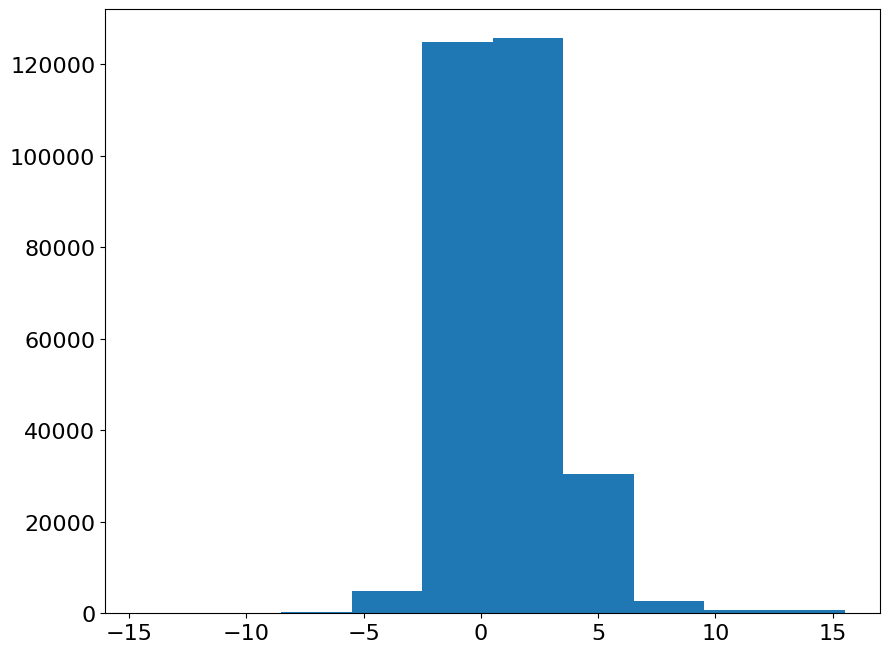

In [9]:
#pl.hist(basetable['mag_ab_405m410'])
#pl.hist(basetable['mag_ab_f212n'])
pl.hist(extcolor)

In [10]:
def extinction_contour_plot(minext, maxext, extcolor=extcolor):
    avm = pyavm.AVM.from_image(f'{basepath}/images/BrickJWST_nrca_longwave_narrowband_rotated_lighter.png')
    img_narrow = np.array(PIL.Image.open(f'{basepath}/images/BrickJWST_nrca_longwave_narrowband_rotated_lighter.png'))[::-1,:,:]
    wwi_narrow = wcs.WCS(fits.Header.fromstring(avm.Spatial.FITSheader))

    img_narrow = img_narrow.swapaxes(0,1)
    wwi_narrow = wwi_narrow.sub([2,1])

    fig = pl.figure(figsize=(12,12))
    ax = pl.subplot(projection=wwi_narrow)
    ax.imshow(img_narrow)

    s1 = sel & (extcolor>minext) & (extcolor<maxext)
    xx = np.linspace(crds.ra.min(), crds.ra.max(), 25).value
    yy = np.linspace(crds.dec.min(), crds.dec.max(), 25).value
    zz, xe, ye = np.histogram2d(crds[s1].ra.value, crds[s1].dec.value, bins=[xx, yy])
    cx = (xx[1:]+xx[:-1])/2
    cy = (yy[1:]+yy[:-1])/2
    pl.contour(cy, cx, zz, transform=ax.get_transform('world'));
    pl.colorbar();
    pl.title(f"Extinction color {minext} to {maxext} mag");

Set OBSGEO-B to   -20.646359 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526234830.949 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


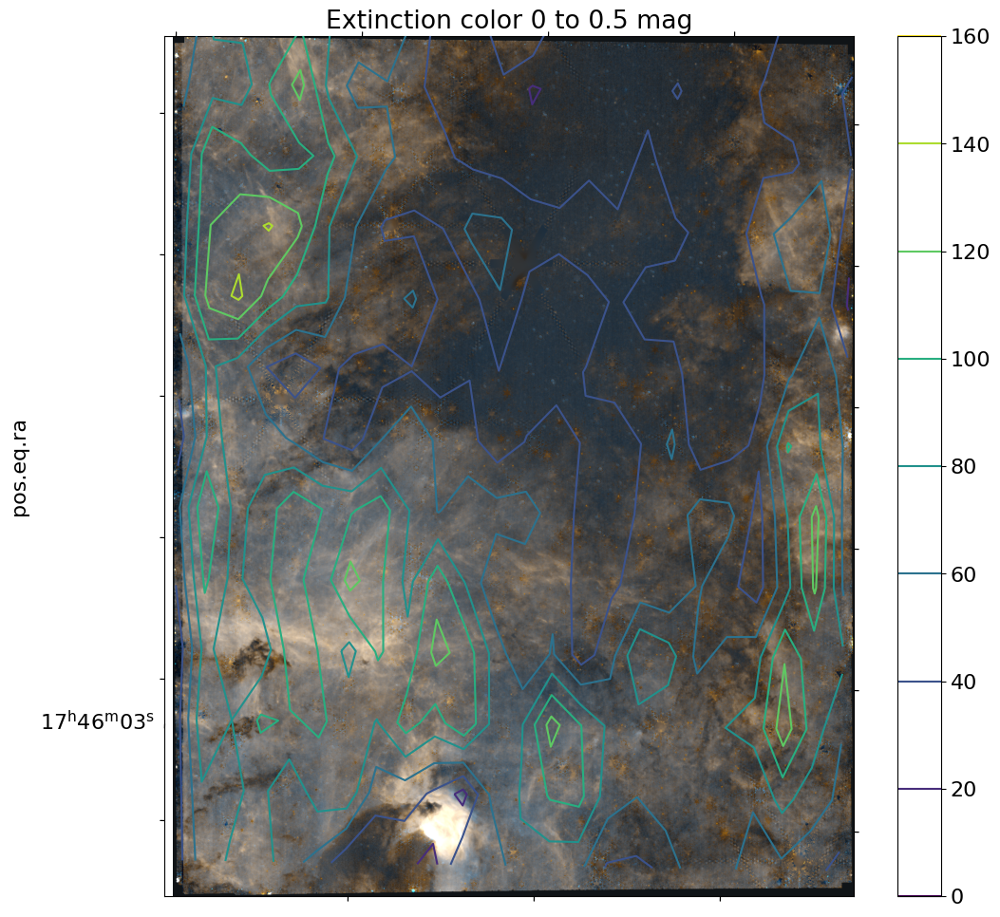

In [11]:
extinction_contour_plot(0, 0.5)

Set OBSGEO-B to   -20.646359 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526234830.949 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


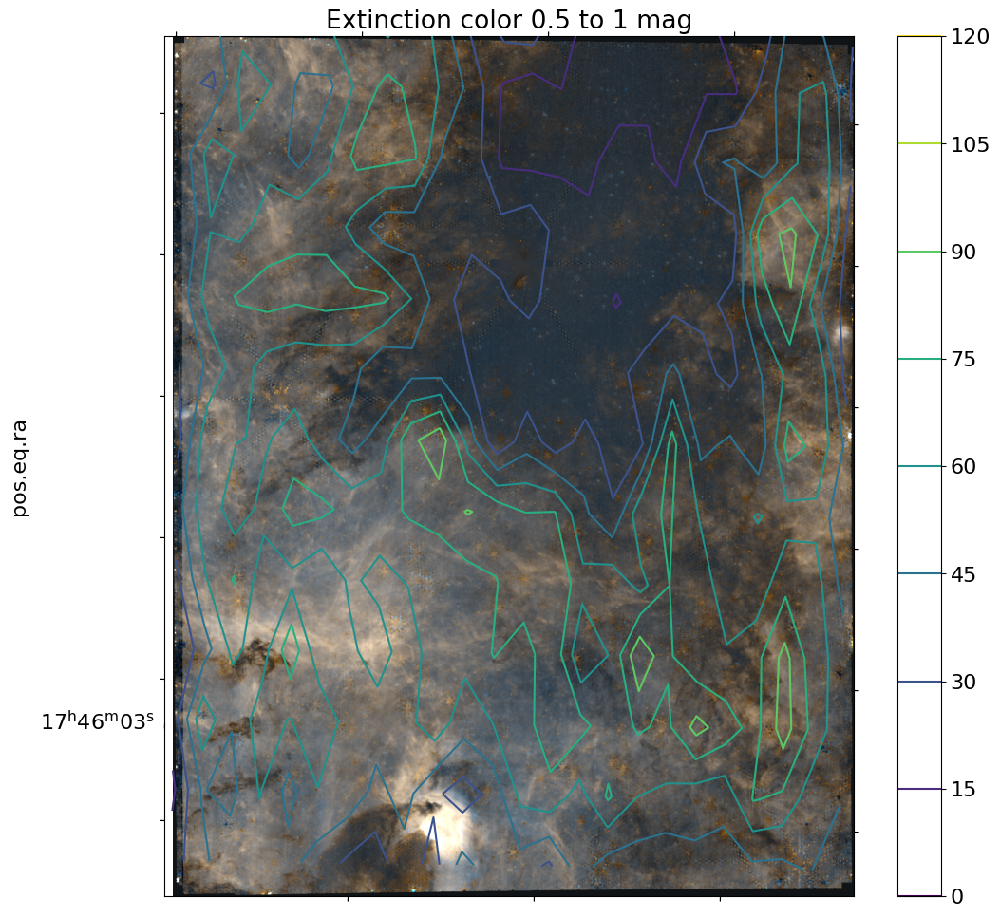

In [12]:
extinction_contour_plot(0.5, 1)

Set OBSGEO-B to   -20.646359 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526234830.949 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


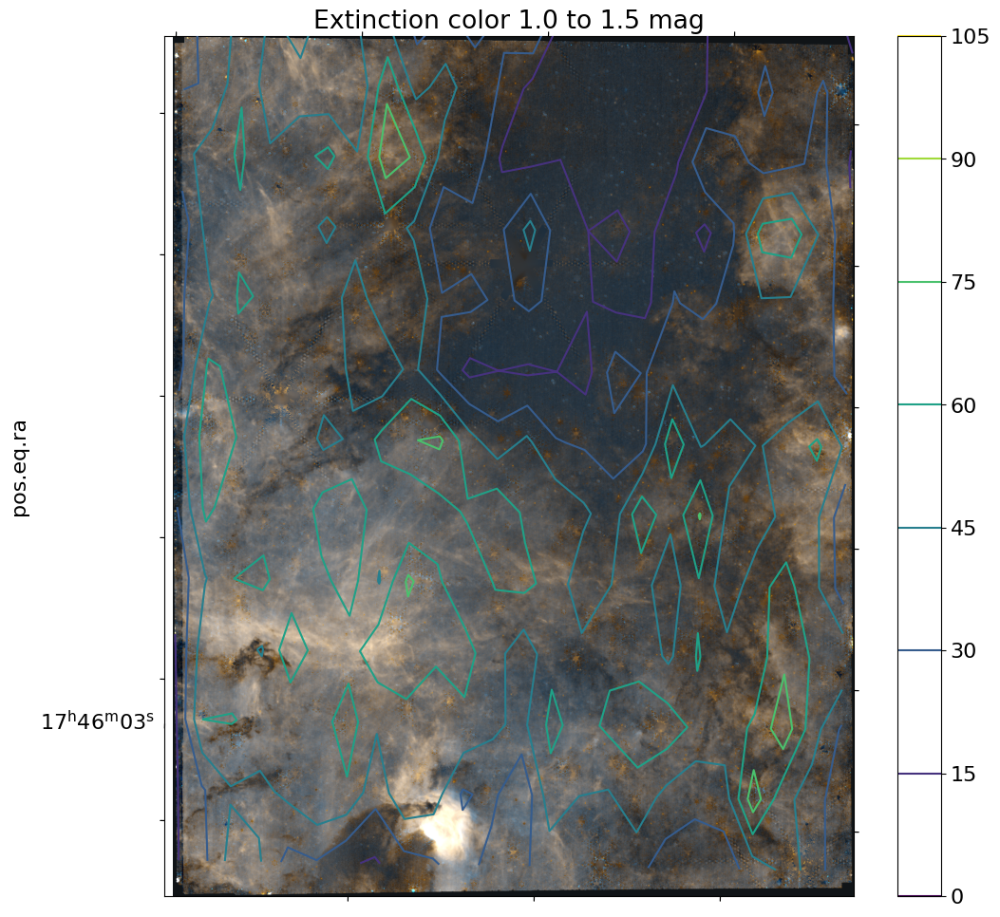

In [13]:
extinction_contour_plot(1.0, 1.5)

Set OBSGEO-B to   -20.646359 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526234830.949 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


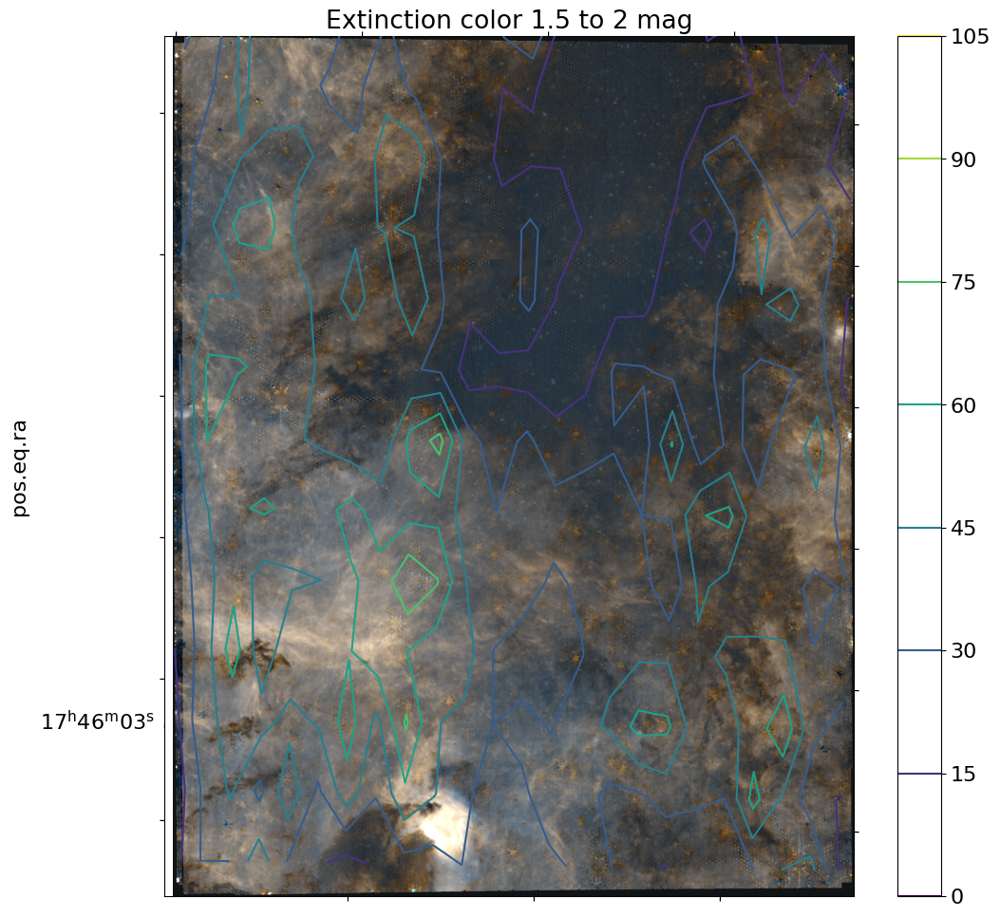

In [14]:
extinction_contour_plot(1.5, 2)

Set OBSGEO-B to   -20.646359 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526234830.949 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


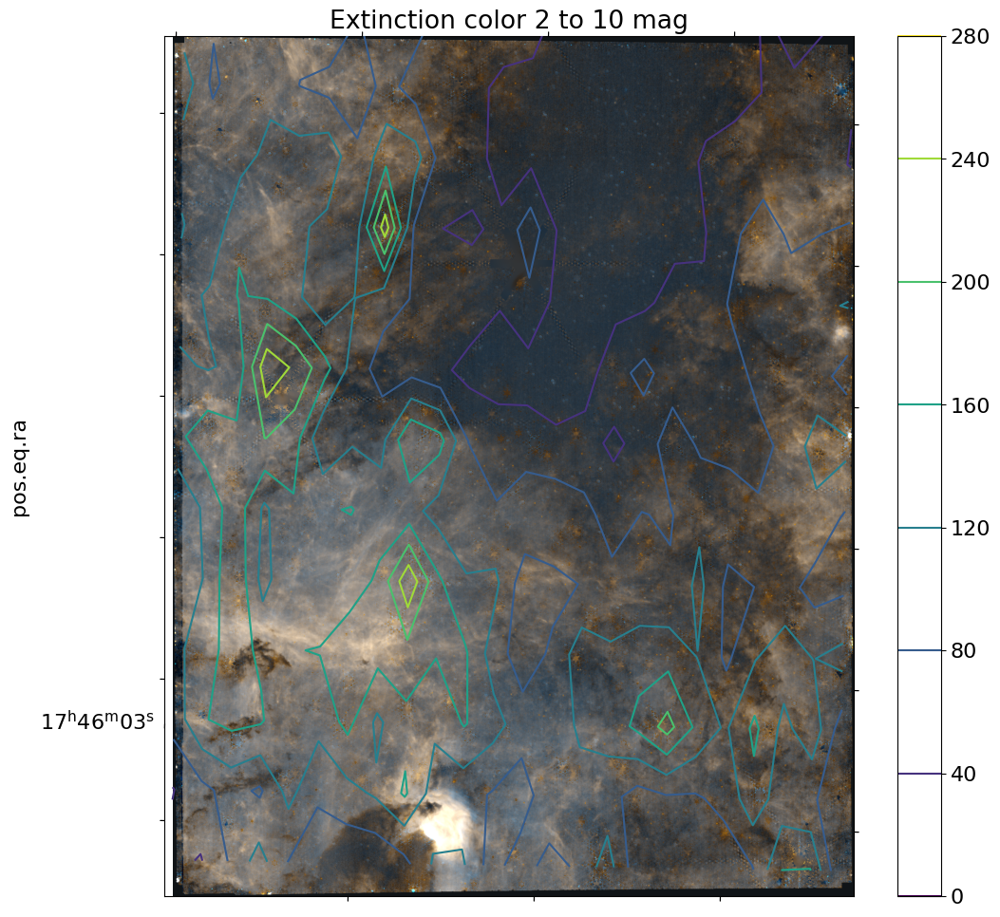

In [15]:
extinction_contour_plot(2, 10)

Set OBSGEO-B to   -20.646359 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526234830.949 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


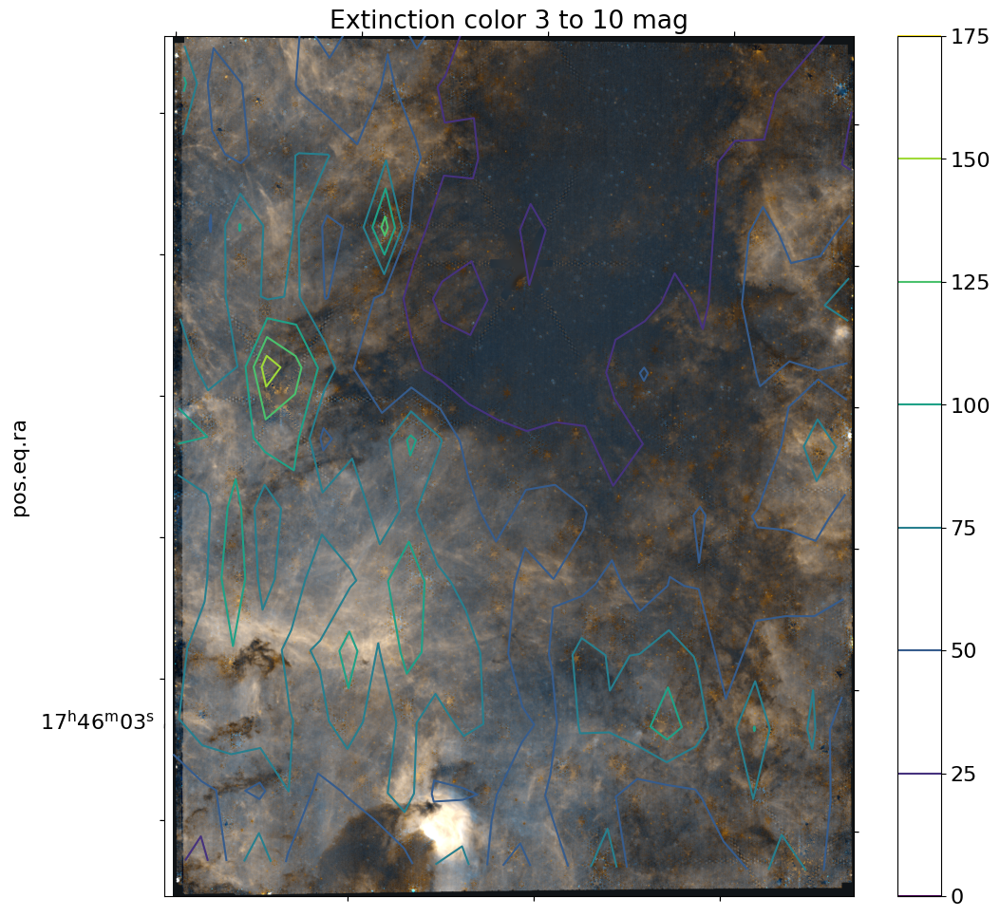

In [16]:
extinction_contour_plot(3, 10)

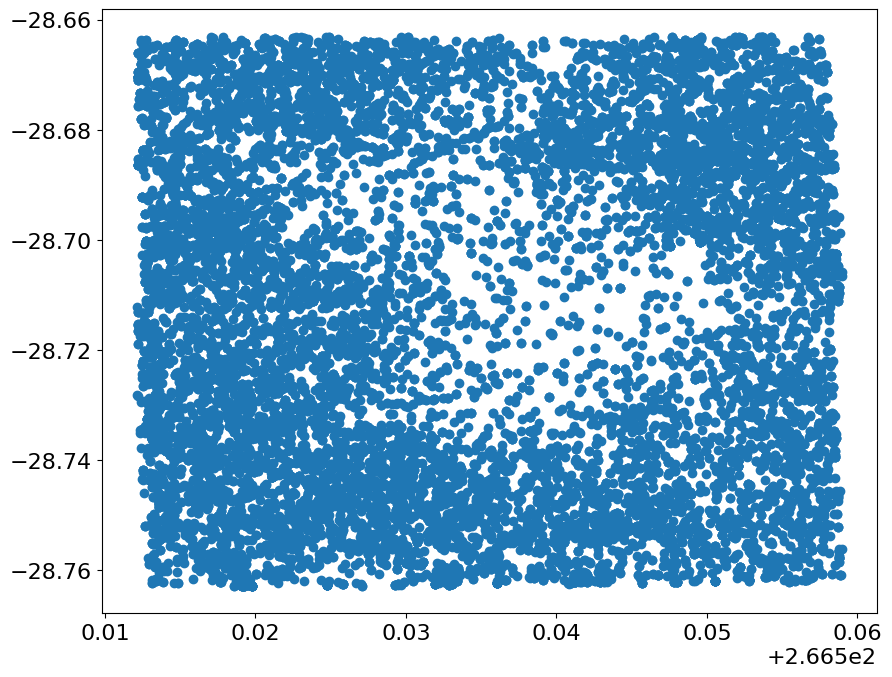

In [17]:
s1 = sel & (extcolor>4) & (extcolor<10)
xx = np.linspace(crds.ra.min(), crds.ra.max(), 25).value
yy = np.linspace(crds.dec.min(), crds.dec.max(), 25).value
zz, xe, ye = np.histogram2d(crds[s1].ra.value, crds[s1].dec.value, bins=[xx, yy])
cx = (xx[1:]+xx[:-1])/2
cy = (yy[1:]+yy[:-1])/2
pl.scatter(crds[s1].ra.deg, crds[s1].dec.deg)
#pl.contour(cx, cy, zz);
#pl.colorbar();

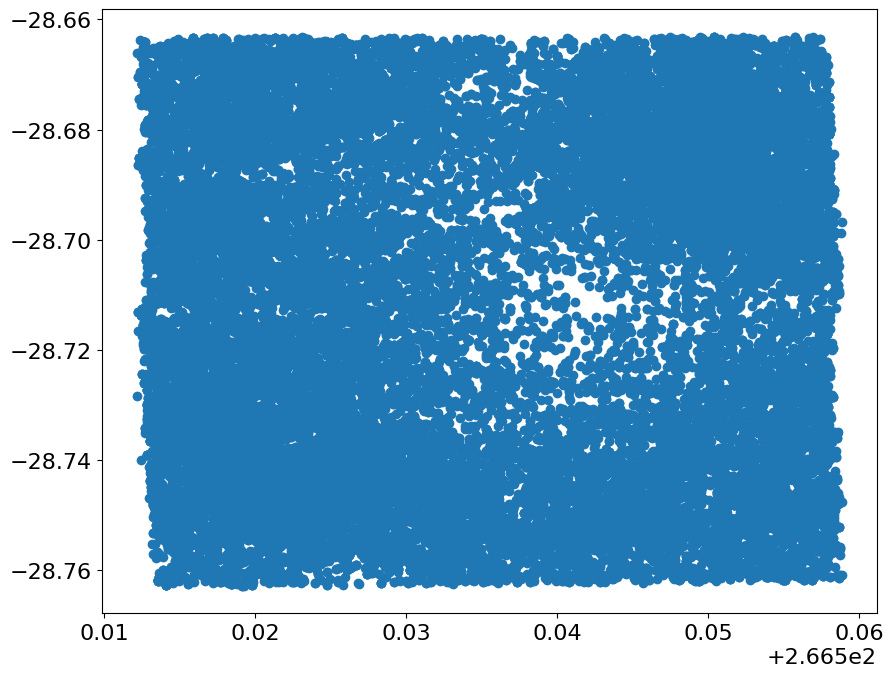

In [18]:
s1 = sel & (extcolor>2) & (extcolor<4)
xx = np.linspace(crds.ra.min(), crds.ra.max(), 25).value
yy = np.linspace(crds.dec.min(), crds.dec.max(), 25).value
zz, xe, ye = np.histogram2d(crds[s1].ra.value, crds[s1].dec.value, bins=[xx, yy])
cx = (xx[1:]+xx[:-1])/2
cy = (yy[1:]+yy[:-1])/2
pl.scatter(crds[s1].ra.deg, crds[s1].dec.deg)
#pl.contour(cx, cy, zz);
#pl.colorbar();

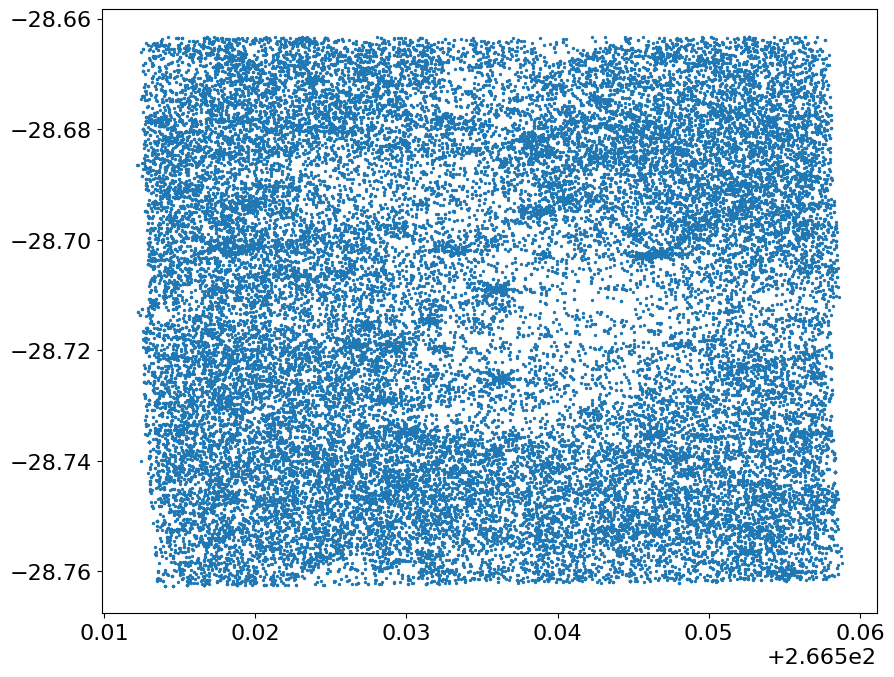

In [19]:
s1 = sel & (extcolor>1) & (extcolor<2)
xx = np.linspace(crds.ra.min(), crds.ra.max(), 25).value
yy = np.linspace(crds.dec.min(), crds.dec.max(), 25).value
zz, xe, ye = np.histogram2d(crds[s1].ra.value, crds[s1].dec.value, bins=[xx, yy])
cx = (xx[1:]+xx[:-1])/2
cy = (yy[1:]+yy[:-1])/2
pl.scatter(crds[s1].ra.deg, crds[s1].dec.deg, s=2)
#pl.contour(cx, cy, zz);
#pl.colorbar();

Set OBSGEO-B to   -20.646359 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526234830.949 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


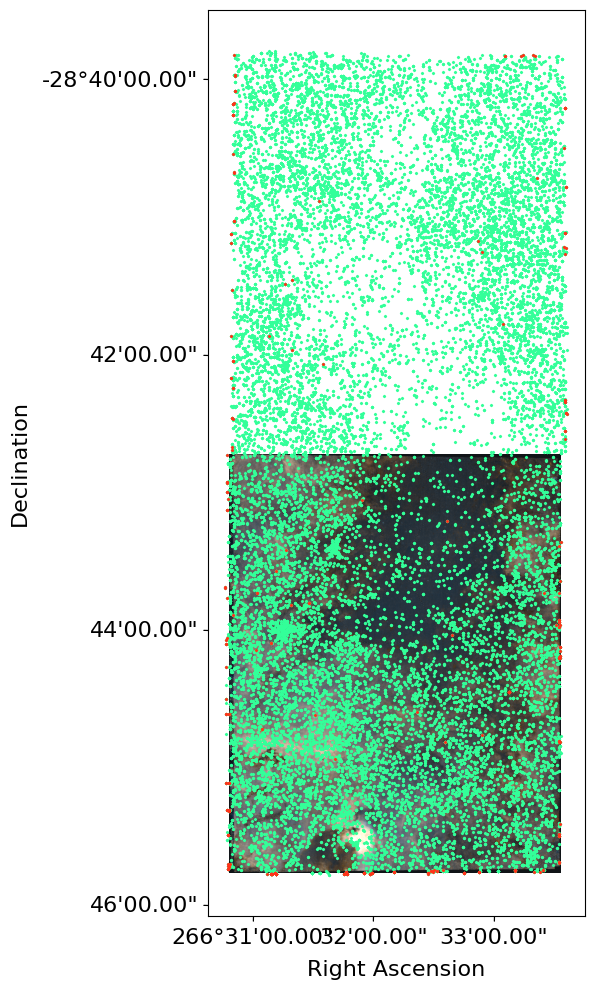

In [20]:
# "high extinction" stars (extcolor > 3)


avm = pyavm.AVM.from_image(f'{basepath}/images/BrickJWST_nrca_longwave_narrowband_rotated_lighter.png')
img_narrow = np.array(PIL.Image.open(f'{basepath}/images/BrickJWST_nrca_longwave_narrowband_rotated_lighter.png'))[::-1,:,:]
#wwi_bra_410 = avm.to_wcs(use_full_header=True)
wwi_narrow = wcs.WCS(fits.Header.fromstring(avm.Spatial.FITSheader))

img_narrow = img_narrow.swapaxes(0,1)
wwi_narrow = wwi_narrow.sub([2,1])

fig = pl.figure(figsize=(12,12))
ax = pl.subplot(projection=wwi_narrow)
ax.imshow(img_narrow)

crds = basetable['skycoord_f410m']
ax.scatter(
    crds.dec[~magerr_gtpt1 & oksep & ~any_saturated & ~badblue & (extcolor > 3) & ~extcolor.mask],
    crds.ra[~magerr_gtpt1 & oksep & ~any_saturated & ~badblue & (extcolor > 3) & ~extcolor.mask],
    transform=ax.get_transform('world'),
    s=2,
    marker='x',
    facecolors=(0.2, 1, 0.6),
    #markeredgewidth=0.5,
    # for non-x facecolors='none'
    #edgecolors=(0.3, 0.5, 0.8), 
);
ax.scatter(
    crds.dec[(~magerr_gtpt1) & oksep & (~any_saturated) & (~badblue) & (extcolor > 7) & ~extcolor.mask],
    crds.ra[(~magerr_gtpt1) & oksep & (~any_saturated) & (~badblue) & (extcolor > 7) & ~extcolor.mask],
    transform=ax.get_transform('world'),
    s=2,
    marker='x',
    facecolors=(1, 0.2, 0.1),
    #markeredgewidth=0.5,
    # for non-x facecolors='none'
    #edgecolors=(0.3, 0.5, 0.8), 
);
#ax.scatter(crds.ra[blue_410_405], crds.dec[blue_410_405], edgecolors='orange', facecolors='none', transform=ax.get_transform('world'))
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['dec'].set_axislabel('Declination')

ra = lon = ax.coords['ra']
dec = lat = ax.coords['dec']
lon.set_major_formatter('dd:mm:ss.ss')
lat.set_major_formatter('dd:mm:ss.ss')
#lon.set_ticks(spacing=30. * u.arcsec, color='red')
#lat.set_ticks(spacing=30. * u.arcsec, color='blue')
#lon.set_ticklabel(color='red')
#lat.set_ticklabel(color='blue')
#lon.grid(color='red')
#lat.grid(color='blue')

dec.set_ticks_position('l')
dec.set_ticklabel_position('l')
dec.set_axislabel_position('l')
ra.set_ticks_position('b')
ra.set_ticklabel_position('b')
ra.set_axislabel_position('b')
# fig.savefig(f"{basepath}/images/ExtinctedStars_on_RGB.png", bbox_inches='tight')

In [21]:
(extcolor > 12).sum()

23

In [22]:
extcolor[(~magerr_gtpt1) & oksep & (~any_saturated) & (~badblue) & (extcolor > 12)].mask

array([ True,  True,  True, ...,  True,  True,  True])

In [23]:
basetable['mag_ab_405m410'].mask.sum()

57011

In [24]:
(basetable['sep_f212n'] > 0.1*u.arcsec).sum()

190310

Set OBSGEO-B to   -20.646359 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526234830.949 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Text(0.5, 1.0, 'Blue F410M-F466N stars')

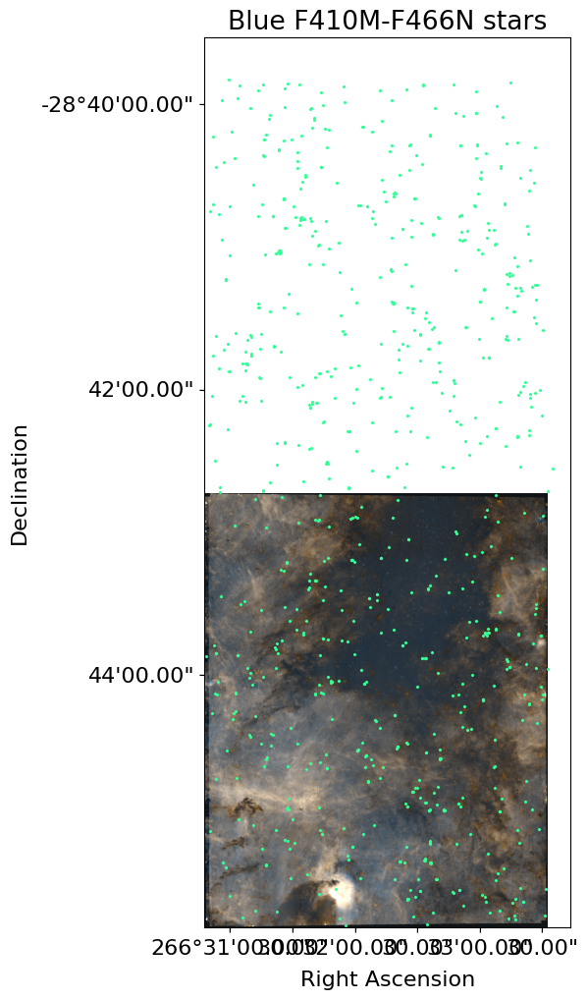

In [25]:
avm = pyavm.AVM.from_image(f'{basepath}/images/BrickJWST_nrca_longwave_narrowband_rotated_lighter.png')
img_narrow = np.array(PIL.Image.open(f'{basepath}/images/BrickJWST_nrca_longwave_narrowband_rotated_lighter.png'))[::-1,:,:]
#wwi_bra_410 = avm.to_wcs(use_full_header=True)
wwi_narrow = wcs.WCS(fits.Header.fromstring(avm.Spatial.FITSheader))

img_narrow = img_narrow.swapaxes(0,1)
wwi_narrow = wwi_narrow.sub([2,1])

fig = pl.figure(figsize=(12,12))
ax = pl.subplot(projection=wwi_narrow)
ax.imshow(img_narrow)

crds = basetable['skycoord_f410m']

# expanded sample
#oksep = np.logical_or.reduce([basetable[f'sep_{filtername}'] for filtername in filternames[1:]])
blue_410_466_incl = (~any_saturated &
                     ((basetable['mag_ab_410m405'] - basetable['mag_ab_f466n']) +
                      (basetable['emag_ab_f410m']**2 + basetable['emag_ab_f466n']**2 + basetable['emag_ab_f405n']**2)**0.5 < -1.75))
thissel = (~magerr_gtpt1 & oksep & ~any_saturated & ~badblue &
           ~basetable['mag_ab_410m405'].mask &
           blue_410_466_incl &
           (basetable['sep_f212n'] > 0.1*u.arcsec))

ax.scatter(
    crds.dec[thissel],
    crds.ra[thissel],
    transform=ax.get_transform('world'),
    s=2,
    marker='x',
    facecolors=(0.2, 1, 0.6),
    #markeredgewidth=0.5,
    # for non-x facecolors='none'
    #edgecolors=(0.3, 0.5, 0.8), 
);

#ax.scatter(crds.ra[blue_410_405], crds.dec[blue_410_405], edgecolors='orange', facecolors='none', transform=ax.get_transform('world'))
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['dec'].set_axislabel('Declination')

ra = lon = ax.coords['ra']
dec = lat = ax.coords['dec']
lon.set_major_formatter('dd:mm:ss.ss')
lat.set_major_formatter('dd:mm:ss.ss')
#lon.set_ticks(spacing=30. * u.arcsec, color='red')
#lat.set_ticks(spacing=30. * u.arcsec, color='blue')
#lon.set_ticklabel(color='red')
#lat.set_ticklabel(color='blue')
#lon.grid(color='red')
#lat.grid(color='blue')

dec.set_ticks_position('l')
dec.set_ticklabel_position('l')
dec.set_axislabel_position('l')
ra.set_ticks_position('b')
ra.set_ticklabel_position('b')
ra.set_axislabel_position('b')
pl.title("Blue F410M-F466N stars")
# fig.savefig(f"{basepath}/images/ExtinctedStars_on_RGB.png", bbox_inches='tight')

Set OBSGEO-B to   -20.646359 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526234830.949 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Text(0.5, 1.0, 'Blue F410M-F466N stars, but allowing for greater magnitude errors')

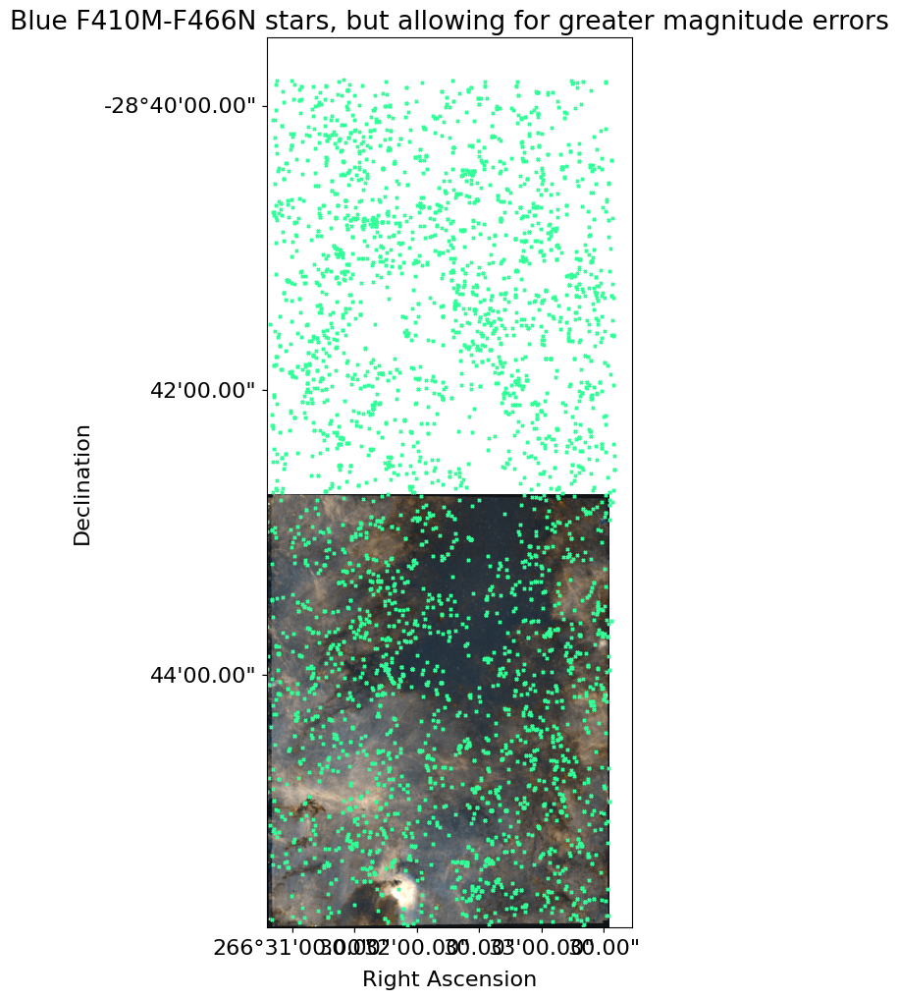

In [26]:
# This image shows only H-alpha stars
avm = pyavm.AVM.from_image(f'{basepath}/images/BrickJWST_nrca_longwave_narrowband_rotated_lighter.png')
img_narrow = np.array(PIL.Image.open(f'{basepath}/images/BrickJWST_nrca_longwave_narrowband_rotated_lighter.png'))[::-1,:,:]
#wwi_bra_410 = avm.to_wcs(use_full_header=True)
wwi_narrow = wcs.WCS(fits.Header.fromstring(avm.Spatial.FITSheader))

img_narrow = img_narrow.swapaxes(0,1)
wwi_narrow = wwi_narrow.sub([2,1])

fig = pl.figure(figsize=(12,12))
ax = pl.subplot(projection=wwi_narrow)
ax.imshow(img_narrow)

crds = basetable['skycoord_f410m']

# expanded sample ("incl" for "inclusive")
#oksep = np.logical_or.reduce([basetable[f'sep_{filtername}'] for filtername in filternames[1:]])
blue_410_466_incl = (~any_saturated &
                     ((basetable['mag_ab_410m405'] - basetable['mag_ab_f466n']) +
                      (basetable['emag_ab_f410m']**2 + basetable['emag_ab_f466n']**2 + basetable['emag_ab_f405n']**2)**0.5 < -1.75))
thissel = (oksep & ~any_saturated & ~badblue &# ~magerr_gtpt1 &
           ~basetable['mag_ab_410m405'].mask &
           blue_410_466_incl)

ax.scatter(
    crds.dec[thissel],
    crds.ra[thissel],
    transform=ax.get_transform('world'),
    s=5,
    marker='x',
    facecolors=(0.2, 1, 0.6),
    #markeredgewidth=0.5,
    # for non-x facecolors='none'
    #edgecolors=(0.3, 0.5, 0.8), 
);

#ax.scatter(crds.ra[blue_410_405], crds.dec[blue_410_405], edgecolors='orange', facecolors='none', transform=ax.get_transform('world'))
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['dec'].set_axislabel('Declination')

ra = lon = ax.coords['ra']
dec = lat = ax.coords['dec']
lon.set_major_formatter('dd:mm:ss.ss')
lat.set_major_formatter('dd:mm:ss.ss')
#lon.set_ticks(spacing=30. * u.arcsec, color='red')
#lat.set_ticks(spacing=30. * u.arcsec, color='blue')
#lon.set_ticklabel(color='red')
#lat.set_ticklabel(color='blue')
#lon.grid(color='red')
#lat.grid(color='blue')

dec.set_ticks_position('l')
dec.set_ticklabel_position('l')
dec.set_axislabel_position('l')
ra.set_ticks_position('b')
ra.set_ticklabel_position('b')
ra.set_axislabel_position('b')
pl.title("Blue F410M-F466N stars, but allowing for greater magnitude errors")
# fig.savefig(f"{basepath}/images/ExtinctedStars_on_RGB.png", bbox_inches='tight')